Chargement des images:

In [1]:
import cv2
import numpy as np

Nature = cv2.imread('/content/Nature.jpg')
Marathon = cv2.imread('/content/Marathon.jpg')

image_f = np.array(Marathon)
image_g = np.array(Nature)

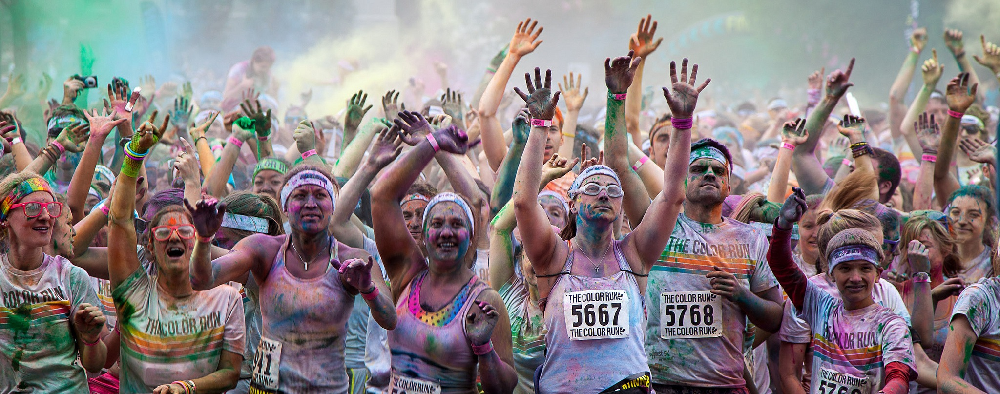

In [2]:
from google.colab.patches import cv2_imshow
cv2_imshow(image_f)

Transformation des images en des vecteurs :

In [5]:
w_f = {}
for i in range(0,image_f.shape[0]):
  for j in range(0,image_f.shape[1]):
    w_f[(i,j)] = image_f[i][j]

In [6]:
w_g = {}
for i in range(0,image_g.shape[0]):
  for j in range(0,image_g.shape[1]):
    w_g[(i,j)] = image_g[i][j]

Génération du Vecteur de direction :

In [7]:
random_vector = np.random.normal(0, 1, 3)
norm = np.linalg.norm(random_vector)
random_vector = random_vector / norm
random_vector

array([-0.66453473,  0.02816879, -0.74672626])

Fonctions Pour manipuler les vecteurs:

In [8]:
def produit_scalaire(vect1, vect2):
  result = 0
  for i in range(len(vect1)):
    result += vect1[i] * vect2[i]
  return result

In [9]:
def produit_tuple(vect1, val):
  new_vect = []
  for i in range(len(vect1)):
    new_vect.append(vect1[i] * val)
  return tuple(new_vect)


In [10]:
def somme_tuple(vect1, vec2):
  vec3 = []
  for i in range(len(vect1)):
    som = int(vect1[i] + vec2[i])
    som = int(som)
    som = max(0,som)
    som = min(255,som)
    vec3.append(som)
  return vec3

Calcul du produit scalaire entre les vecteurs RGB et le vecteur géneré:

In [11]:
new_coords_f = {key: produit_scalaire(value , random_vector) for key, value in w_f.items()}
new_coords_g = {key: produit_scalaire(value, random_vector) for key, value in w_g.items()}

Tri des vecteurs:

In [12]:
sorted_dict_f = dict(sorted(new_coords_f.items(), key=lambda item: item[1]))
sorted_dict_g = dict(sorted(new_coords_g.items(), key=lambda item: item[1]))
sorted_list_f = list(sorted_dict_f.items())
sorted_list_g = list(sorted_dict_g.items())

Modification des valeurs des pixels:

In [13]:
result_coords = {}
i=0
for key,value in sorted_dict_f.items():
  result_coords[key] = produit_tuple( random_vector , (sorted_list_g[i][1] - sorted_dict_f[key]))
  i+=1

In [14]:
for key,value in result_coords.items():
  image_f[key[0]][key[1]]= somme_tuple(image_f[key[0]][key[1]] ,value )


Affichage de résultat aprés une itération:

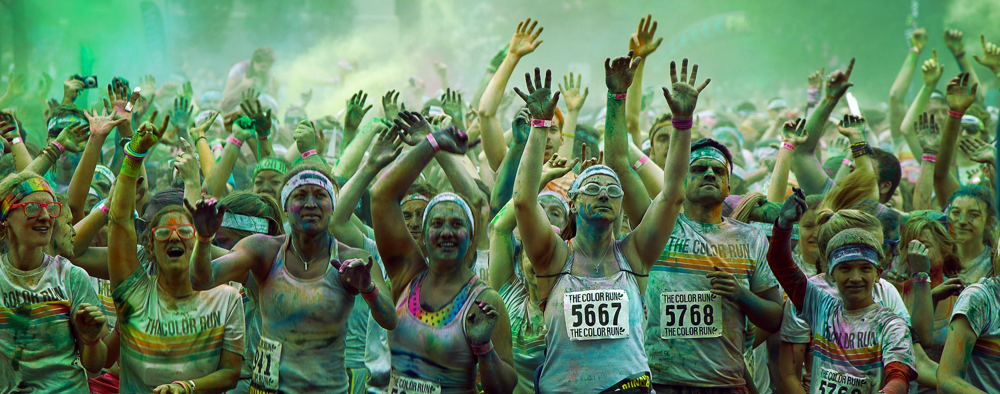

In [15]:
cv2_imshow(image_f)

Résultat aprés 100 itérations:

In [16]:
for _ in range(0,100):
  w_f = {}
  for i in range(0,image_f.shape[0]):
    for j in range(0,image_f.shape[1]):
      w_f[(i,j)] = image_f[i][j]
  w_g = {}
  for i in range(0,image_g.shape[0]):
    for j in range(0,image_g.shape[1]):
      w_g[(i,j)] = image_g[i][j]
  random_vector = np.random.normal(0, 1, 3)
  norm = np.linalg.norm(random_vector)
  random_vector = random_vector / norm
  new_coords_f = {key: produit_scalaire(value , random_vector) for key, value in w_f.items()}
  new_coords_g = {key: produit_scalaire(value, random_vector) for key, value in w_g.items()}
  sorted_dict_f = dict(sorted(new_coords_f.items(), key=lambda item: item[1]))
  sorted_dict_g = dict(sorted(new_coords_g.items(), key=lambda item: item[1]))
  sorted_list_f = list(sorted_dict_f.items())
  sorted_list_g = list(sorted_dict_g.items())
  result_coords = {}
  i=0
  for key,value in sorted_dict_f.items():
    result_coords[key] = produit_tuple( random_vector , (sorted_list_g[i][1] - sorted_dict_f[key]))
    i+=1
  for key,value in result_coords.items():
    image_f[key[0]][key[1]]= somme_tuple(image_f[key[0]][key[1]] ,value )

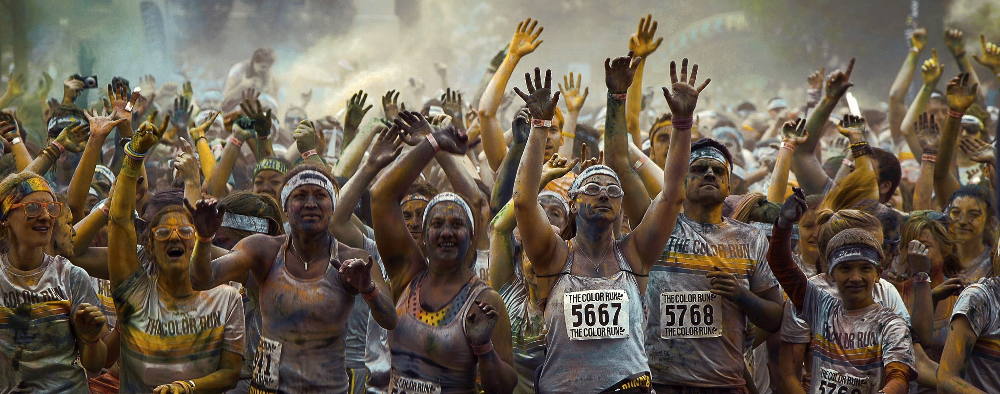

In [17]:
cv2_imshow(image_f)

In [18]:
cv2.imwrite("result.jpg", image_f)

True